In [1]:
import matplotlib.pyplot as plt
import sys, os
import numpy as np
from scipy import interpolate, integrate
from astropy import cosmology, units, constants
from matplotlib import cm, colors, rc
from scipy import interpolate
import tqdm 
import h5py
from scipy.integrate import cumulative_trapezoid as cumtrapz, simpson as simps, trapezoid as trapz

In [2]:
# import py21cmfast as p21c
# print(f"21cmFAST version is {p21c.__version__}")

In [3]:
sys.path.insert(0, '../')

In [4]:
from utils import *
from parameters import nu21_ref

In [5]:
# rc('font',**{'family':'serif', 'serif':['times new roman'], 'size': 18})
# rc('text', usetex=True)

In [6]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [7]:
# Cosmology
cos = cosmology.Planck18
Yp = 0.2453 # primordial fraction of He
Xp = 1. - Yp # primordial fraction of H
mh = constants.m_n #kg, mass of H atom
rhoc = cos.critical_density0.si #kg m-3, critical density of the Universe
nh = Xp*cos.Ob0*rhoc/mh  # m-3, number density of H 
fH = 1.08 #ignore He reion at this point

In [8]:
T_cmb = 2.7255
T_CMB_uK=T_cmb*1e6  

In [9]:
zmin = 5.0
zmax = 15.0

N = 1070
L = 1500.

In [10]:
L/N

1.4018691588785046

In [11]:
#p21c.UserParams(
user_params = {'HII_DIM':N, 'BOX_LEN':L, 'KEEP_3D_VELOCITIES':True, 'N_THREADS':5, 'USE_INTERPOLATION_TABLES':True,} 
# )

In [12]:
#p21c.AstroParams(
astro_params = {"ALPHA_STAR":0.614, "F_STAR10":-1.42, "F_ESC10":-1.78, "ALPHA_ESC":0.474, "M_TURN":8.62, "t_STAR":0.392}
#)
#p21c.CosmoParams(
cosmo_params = {'hlittle':0.67, 'OMm':0.321, 'OMb':0.049, 'SIGMA_8':0.81, 'POWER_INDEX':0.963}
# )

In [13]:
# lc = p21c.run_lightcone(
#     lightconer=lcn,
#     global_quantities=("brightness_temp", 'density', 'xH_box'),
#     direc='/home/agorce/scratch/_cache',
#     user_params=user_params,
#     random_seed=12345,
# )
# lc = p21c.LightCone.read('/data/cluster/agorce/big_lightcone_21cmfast.h5')

In [14]:
# lc.cosmo_params, lc.user_params, lc.astro_params, lc.flag_options

In [15]:
# lc.random_seed

In [16]:
# plotting.lightcone_sliceplot(lc)

In [17]:
# extract lc redshift nodes and corresponding redshifts
# zz = np.array(lc.lightcone_redshifts)[::-1]
# lc_dists = np.array(lc.lightcone_distances)[::-1]
# n_lc = len(zz)

In [18]:
fl = h5py.File('/data/cluster/agorce/big_lightcone_21cmfast.h5', "r")

# Tb = fl['lightcones']['brightness_temp'][:]
lc_density = np.array(fl['lightcones']['density'][:])[..., ::-1]
lc_xion = 1. - np.array(fl['lightcones']['xH_box'][:])[..., ::-1]
lc_velocity = np.array(fl['lightcones']['velocity'][:])[..., ::-1]
lc_brightness_temp = np.array(fl['lightcones']['brightness_temp'][:])[..., ::-1]
assert lc_xion.ndim==3

global_Tb = fl['global_quantities']['brightness_temp'][:]
z_nodes = fl['node_redshifts'][:]
glob_density = np.array(fl['global_quantities']['density'][:])
glob_xHII = np.array(1. - fl['global_quantities']['xH_box'][:])
glob_fH = np.ones(z_nodes.shape) * fH #first helium reionisation

lc_dists = fl['distances'][:][::-1]
n_lc = len(lc_dists)
zz = np.loadtxt('big_lightcone_21cmfast_zvalues.txt')

fl.close()

In [19]:
theta = 2.*np.arctan(L*units.Mpc/2./cos.comoving_distance(zz.min())).to(units.degree).value

In [20]:
# lc_xion = (1. - lc.xH_box[..., ::-1]) 
# lc_density = np.array(lc.density[..., ::-1])

### Ionisation history

In [21]:
# z_nodes = np.array(lc.node_redshifts)
# glob_density = np.array(lc.global_density)
# glob_xHII = np.array(1. - lc.global_xH)
# # glob_xHII_mass_avg = 
# glob_fH = np.ones(z_nodes.shape) * fH #first helium reionisation

In [22]:
zlin = np.linspace(0, z_nodes.max(), 300)
xlin = interpolate.interp1d(z_nodes, glob_xHII, fill_value=1., bounds_error=False)(zlin)

In [23]:
lc_xHII_wavg = np.mean(lc_xion * (1. + lc_density), axis=(0,1))
lc_xHII = np.mean(lc_xion, axis=(0, 1))

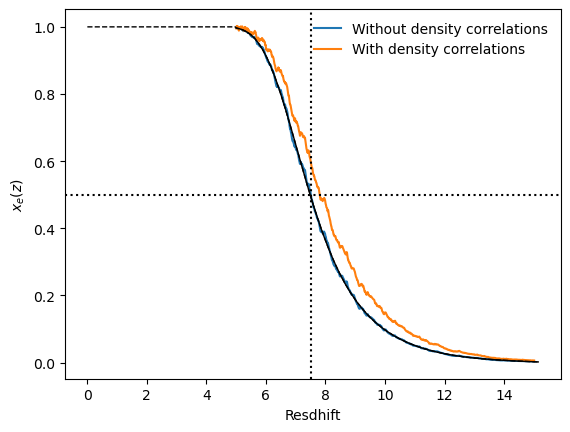

In [24]:
plt.plot(zz, lc_xHII, label='Without density correlations', lw=1.5)
plt.plot(zz, lc_xHII_wavg, label='With density correlations', lw=1.5)
plt.plot(z_nodes, glob_xHII, color='k', lw=1.)
plt.plot(zlin, xlin, ls='--', color='k', lw=1.)
plt.xlabel('Resdhift')
plt.ylabel(r'$x_e(z)$')
plt.legend(frameon=False)
plt.axhline(0.5, color='k', ls=':')
plt.axvline(7.5, color='k', ls=':')

In [25]:
np.savetxt('data_big_lightcone/big_lightcone_reion_history.txt', np.c_[zz, np.mean(lc_xion, axis=(0, 1))])

## Density field

In [26]:
cmap = colormaps['viridis']
norm = colors.LogNorm(vmin=5e-4, vmax=1.)

In [70]:
nbins = 30
pkbb, pkbb_err = np.zeros((z_nodes.size, nbins)), np.zeros((z_nodes.size, nbins))
for iz, z in enumerate(tqdm.tqdm(z_nodes)):
    ii = np.argmin(np.abs(zz-z))
    kbb, pkbb[iz], pkbb_err[iz] = compute_ps1d(lc_density[..., ii], L, nbins=nbins)
np.savetxt('data_big_lightcone/big_lightcone_pkbb.txt', np.c_[kbb[1:], pkbb[:, 1:].T])
pkbb *= np.pi/kbb[None, :]

100%|██████████| 51/51 [00:17<00:00,  2.94it/s]


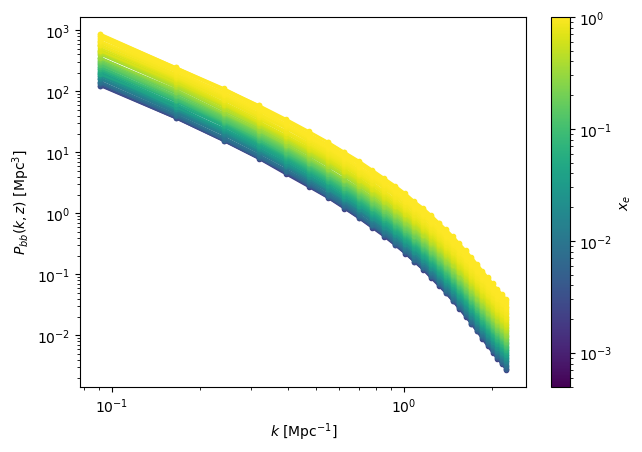

In [28]:
fig, ax = plt.subplots()
for iz, z in enumerate(z_nodes):
    ax.loglog(kbb[1:], pkbb[iz, 1:], color=cmap(norm(glob_xHII[iz])), marker='.', label=z)
# ax.set_ylim(1e0, 1e7)
# ax.legend()
ax.set_xlabel(r'$k$ [Mpc$^{-1}]$')
ax.set_ylabel(r'$P_{bb}(k, z)$ [Mpc$^3]$')
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
c_bar = plt.colorbar(sm, fraction=0.05, label=r'$x_e$', ax=ax)

## Electron power spectrum

In [29]:
#constructing field
lc_dens_e = np.multiply(lc_xion, 1.+lc_density, dtype=np.float32) #free electrons density

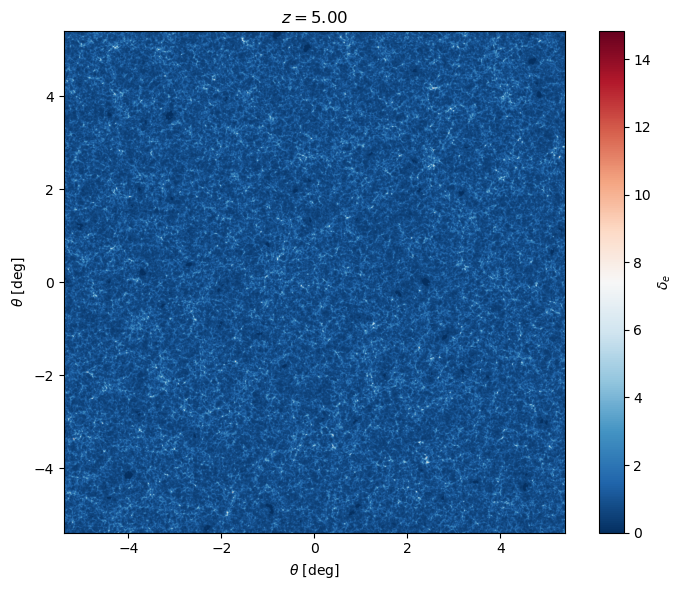

In [30]:
ii = -1#3*n_lc//4

fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(lc_dens_e[..., ii], cmap='RdBu_r',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'$\delta_e$')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
ax.set_title(rf'$z={zz[ii]:.2f}$')
fig.tight_layout()
# fig.savefig(f'dTb_map_z{zz[ii]:.1f}.png', dpi=220)

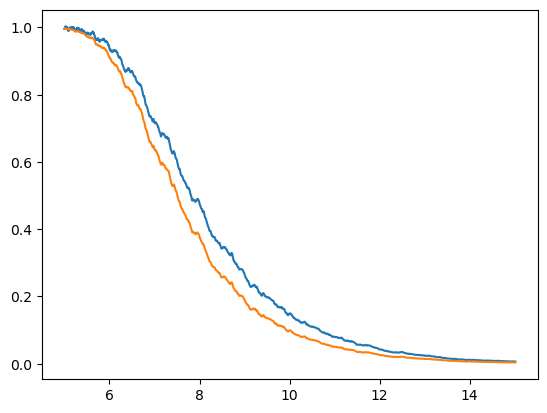

In [31]:
plt.plot(zz, np.mean(lc_dens_e, axis=(0,1)))
plt.plot(zz, np.mean(lc_xion, axis=(0,1)))

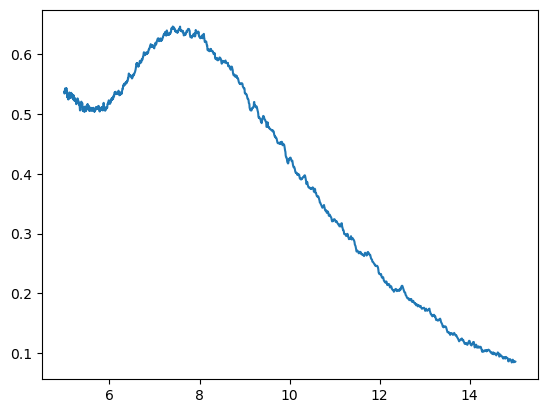

In [32]:
plt.plot(zz, np.std(lc_dens_e - np.mean(lc_dens_e, axis=(0, 1))[None, None, :], axis=(0,1)))

In [45]:
nbins = 30
pkee_lc, pkbb_lc = np.zeros((n_lc, nbins)), np.zeros((n_lc, nbins))
for iz, z in enumerate(tqdm.tqdm(zz)):
    map = lc_dens_e[..., iz]/np.mean(lc_dens_e[..., iz]) - 1.
    kee, pkee_lc[iz], _ = compute_ps1d(map, L, nbins=nbins)
    kbb, pkbb_lc[iz], _ = compute_ps1d(lc_density[..., iz], L, nbins=nbins)
# correct from 2D to 3D PS
pkee_lc *= np.pi/kee[None, :]
pkbb_lc *= np.pi/kbb[None, :]

  0%|          | 0/1790 [00:00<?, ?it/s]

  3%|▎         | 62/1790 [02:15<1:03:05,  2.19s/it]


KeyboardInterrupt: 

In [ ]:
# interpolate values of Pee and Pbb over k, z
Pee2d = interpolate.RegularGridInterpolator((kee, zz), pkee_lc.T, bounds_error=False, fill_value=None)
Pbb2d = interpolate.RegularGridInterpolator((kee, zz), pkbb_lc.T, bounds_error=False, fill_value=None)

In [34]:
nbins = 30
pkee, pkee_err = np.zeros((z_nodes.size, nbins)), np.zeros((z_nodes.size, nbins))
for iz, z in enumerate(tqdm.tqdm(z_nodes)):
    ii = np.argmin(np.abs(zz-z))
    map = lc_dens_e[..., ii]/np.mean(lc_dens_e[..., ii]) - 1.
    kee, pkee[iz], pkee_err[iz] = compute_ps1d(map, L, nbins=nbins)
np.savetxt('data_big_lightcone/big_lightcone_pkee.txt', np.c_[kee[1:], pkee[:, 1:].T])
pkee *= np.pi/kee[None, :]

  0%|          | 0/51 [00:00<?, ?it/s]

100%|██████████| 51/51 [00:16<00:00,  3.07it/s]


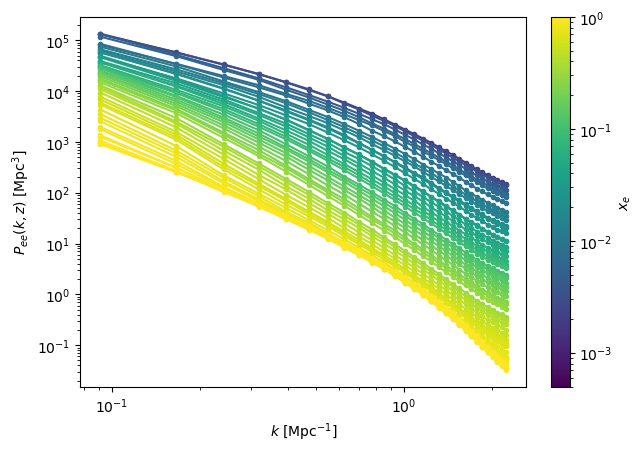

In [35]:
fig, ax = plt.subplots()
for iz, z in enumerate(z_nodes):
    ax.loglog(kee[1:], pkee[iz, 1:], color=cmap(norm(glob_xHII[iz])), marker='.', label=z)
# ax.set_ylim(1e0, 1e7)
# ax.legend()
ax.set_xlabel(r'$k$ [Mpc$^{-1}]$')
ax.set_ylabel(r'$P_{ee}(k, z)$ [Mpc$^3]$')
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
c_bar = plt.colorbar(sm, fraction=0.05, label=r'$x_e$', ax=ax)

## Optical depth

\begin{equation}
\tau(z)=c\left\langle n_{\mathrm{H}}\right\rangle \sigma_{\mathrm{T}} \int_{z_\mathrm{recomb}}^z \frac{x_e\left(z^{\prime}\right)}{H\left(z^{\prime}\right)}\left(1+z^{\prime}\right)^2 \mathrm{~d} z^{\prime}
\end{equation}

-0.0 0.0


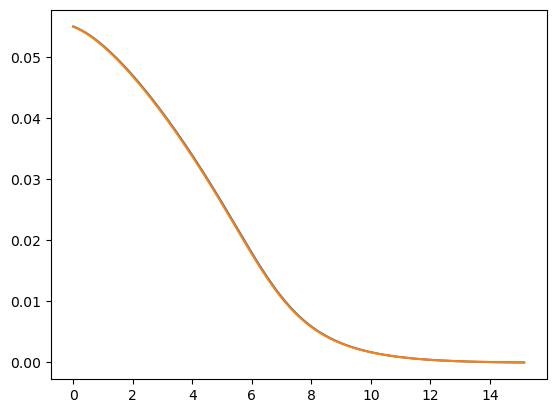

In [36]:
z = np.sort(zlin)[::-1]
xe = np.sort(xlin)
integ = (
    constants.c.si.value
    * constants.sigma_T.value
    * nh.value
    * xe * fH
    / cos.H(z).si.value
    * (1 + z) ** 2
)
tofz2 = np.zeros_like(z)
dz = -np.diff(z)
for iz in range(z.size-1):
    tofz2[iz+1] += integ[iz] * dz[iz] + tofz2[iz]
tofz = -cumtrapz(integ, z, initial=0)
print(tofz[0], tofz2[0])
tau_sim = tofz[0]

plt.plot(z, tofz)
plt.plot(z, tofz2)

In [37]:
# dtau_lc = constants.c.si.value * constants.sigma_T.si.value * nh.value * lc_xion * fH / cos.H(zz).si[None, None, :].value \
#             * (1 + zz[None, None, :])**2
# tau_lc = -cumtrapz((dtau_lc * (1. + lc_density)), zz, initial=0)
# tau_lc_no_density_corr = -cumtrapz(dtau_lc, zz, initial=0)

dtau_lc = constants.sigma_T.si * nh * lc_xion * fH * (1 + zz[None, None, :])**2
tau_lc = -cumtrapz(dtau_lc.to(1./units.Mpc).value * (1. + lc_density), lc_dists, initial=0)
tau_lc_no_density_corr = -cumtrapz(dtau_lc.to(1./units.Mpc).value, lc_dists, initial=0)

Text(0, 0.5, 'Optical depth')

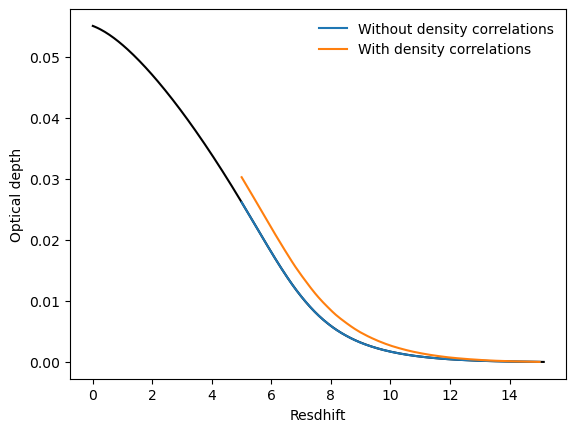

In [38]:
plt.plot(z, tofz, color='k')
plt.plot(zz, np.mean(tau_lc_no_density_corr, axis=(0, 1)), label='Without density correlations')
plt.plot(zz, np.mean(tau_lc, axis=(0, 1)), label='With density correlations')
# plt.plot(z_nodes, tau_global, ls='--', color='k')
plt.xlabel('Resdhift')
plt.legend(frameon=False)
plt.ylabel('Optical depth')

In [39]:
tau_sim = tofz.max()
print(tau_sim)

0.05506573021172335


In [40]:
tau_map = tau_lc[..., -1]-np.mean(tau_lc[..., -1])

5.362118295892449e-18


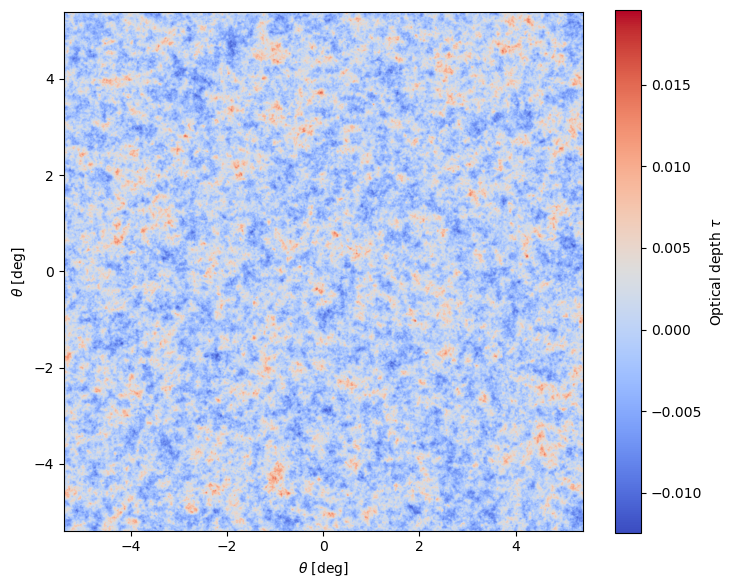

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(tau_map, cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'Optical depth $\tau$')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
# ax.set_title(rf'$z={zz[ii]:.2f}$')
# print(tau_array.mean())
fig.tight_layout()

print(np.mean(tau_map))

# fig.savefig(f'tau_map_z{zz[ii]:.1f}.png', dpi=220)
# fig.savefig(f'tau_map.pdf', dpi=220)


In [42]:
# compute the angular ps from the map
l, cl_tau_tau, el_tau_tau = compute_cross_angular_spectrum(tau_map, tau_map, theta*np.pi/180., nbins=50)
_, cl_tau_tau_no_dens_corr, el_tau_tau_no_dens_corr = compute_cross_angular_spectrum(tau_lc_no_density_corr[..., -1], tau_lc_no_density_corr[..., -1], theta*np.pi/180., nbins=50)

/data/glx-calcul3/data1/agorce/cross-correlations/cross-correlations/With_Pee/with_py21cmfast/../utils.py:297: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(pk2-pk**2),


In [43]:
# k, pktau, _ = compute_ps1d(tau_map, L, nbins=50)
# pktau *= k ** 2
# ls = k* lc_dists[0]  # Mpc

In [ ]:
# compute the angular ps from Pee
ells = np.copy(l)
kmax_ells = np.max(ells) / cos.comoving_distance(zz.min()).value

# Define integration ranges
k_z_integ = ells[:, None] / cos.comoving_distance(zz).value  # [Mpc-1]

Pee_z_integ = Pee2d(np.array([k_z_integ, np.ones((ells.size, zz.size))*zz]).T)

prefac = (constants.sigma_T.si**2  # Thomson cross section [m    2]
            * (nh.to(1. / units.m**3))**2  # baryon nb density [m-3]
            )


# Compute C_tau(ell) integrand, unit 1
C_ell_tau_integrand = (
    np.mean(lc_xion, axis=(0,1))**2
    * (1. + zz)**4
    / (lc_dists*units.Mpc)**2
    * Pee_z_integ.T * (units.Mpc).si**3
) * prefac

# Compute C_kSZ(ell), no units
result = np.array(
    [trapz(-C_ell_tau_integrand[i].to(1./units.Mpc).value, lc_dists)
        for i in range(ells.size)]
)

dl_tau_tau2 = result * l * (l+1) / 2./np.pi

NameError: name 'Pee2d' is not defined

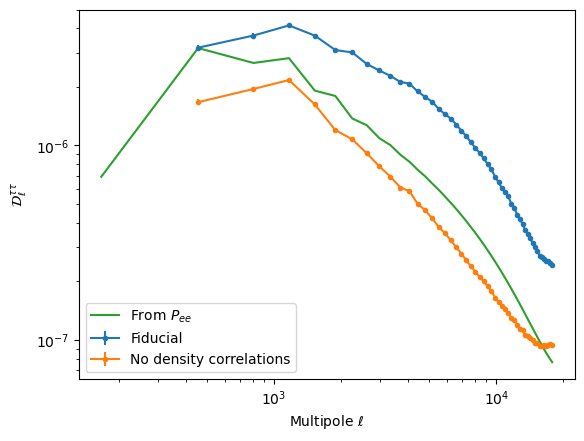

In [ ]:
fig, ax = plt.subplots()
m = (cl_tau_tau != 0.) & (l * (l+1.) * cl_tau_tau_no_dens_corr / 2./np.pi < 2e-5)
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_tau_tau[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_tau_tau[m] / 2./np.pi,
        marker='.', label='Fiducial')
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_tau_tau_no_dens_corr[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_tau_tau_no_dens_corr[m] / 2./np.pi,
        marker='.', label='No density correlations')
ax.loglog(l, dl_tau_tau2, label=r'From $P_{ee}$')
# plt.plot(ls, pktau / 2./np.pi)
plt.xlabel(r'Multipole $\ell$')
plt.ylabel(r'$\mathcal{D}^{\tau\tau}_\ell$')
plt.ylim(top=5e-6)
# plt.yscale('log')
plt.legend()
# plt.xlim(0, 10000)

In [ ]:
l.min(), l.max()

(np.float64(166.884801036566), np.float64(17854.32383432754))

In [ ]:
np.savetxt(
    'data_big_lightcone/big_lightcone_cltautau.txt',
    np.c_[l, cl_tau_tau, el_tau_tau, cl_tau_tau_no_dens_corr, el_tau_tau_no_dens_corr, result],
    header='ell, cltautau, err, cltautau without density corr, err, cltautau from sim pee')

## kSZ

!!! Need to check if velocities are properly used here

In [46]:
PARALLEL_APPROX = False
rotation = True

In [47]:
Mpcm = (1.*units.Mpc).to(units.m).value #m/s

In [48]:
# compute lightcones required to obtain the kSZ signal

velocity = (np.copy(lc_velocity)*units.Mpc).to(units.m)/units.s #m/s #velocities along the line of sight (z direction), in cMpc/s when extracted from code
ion = fH * np.copy(lc_xion)
deltab = np.copy(lc_density)

dR = np.r_[0., -(np.diff(lc_dists)*units.Mpc).to(units.m)]  # (L/N*units.Mpc).to(units.m)
dtau_3d_no_dens_corr = nh*constants.sigma_T.si*ion  #this is used for tau_e contribution # unit 1
Tcmb_3d_no_dens_corr = dtau_3d_no_dens_corr*velocity/constants.c

In [ ]:
# plt.figure()
# plt.plot(zz, np.mean(ion, axis=(0,1)))
# plt.plot(z_nodes, glob_xHII*fH)
# print(zz[0], np.mean(ion[..., 0]))

In [ ]:
# dtau_lc = constants.c.si.value * constants.sigma_T.si.value * nh.value * lc_xion * fH / cos.H(zz).si[None, None, :].value \
#             * (1 + zz[None, None, :])**2 * (1. + lc_density)

In [ ]:
# # integ_tau = constants.c.si.value * constants.sigma_T.si.value * nh.value * glob_xHII * fH / cos.H(z_nodes).si.value * (1+z_nodes)**2
# integ_tau = constants.sigma_T.si * nh * glob_xHII * fH * (1+z_nodes)**2
# tau_global = -cumtrapz(integ_tau.to(1./units.Mpc).value, cos.comoving_distance(z_nodes).value, initial=0)

In [ ]:
# tau_lc = -cumtrapz(dtau_3d.to(1./units.Mpc).value * (1+zz[None, None, :])**2, cos.comoving_distance(zz).value[None, None, :], initial=0, axis=-1)

In [ ]:
# tau_array = np.zeros((N, N))
# for i in tqdm.tqdm(np.arange(0, n_lc)):
#     tau_array += dtau_3d[..., i] * dR[i] * (1+zz[i])**2

In [ ]:
# z = np.sort(zlin)[::-1]
# xe = np.sort(xlin)
# integ = (
#     1. # constants.c.si.value
#     * constants.sigma_T.si
#     * nh
#     * xe * fH
#     # / cos.H(z).si.value
#     * (1 + z) ** 2
# )
# tofz2 = np.zeros_like(z)
# dz = -np.diff(z)
# deta = -np.diff(cos.comoving_distance(z).value)
# for iz in range(z.size-1):
#     tofz2[iz+1] += integ[iz].to(1./units.Mpc).value * deta[iz] + tofz2[iz]
# tofz = -cumtrapz(integ.to(1./units.Mpc).value, cos.comoving_distance(z).value, initial=0)
# print(tofz[0], tofz2[0])
# tau_sim = tofz[0]

# plt.figure()
# plt.plot(zz, np.mean(tau_lc, axis=(0,1)))
# plt.plot(z, tofz)
# plt.plot(z, tofz2)

In [64]:
# integration along the lightcone
# tx, ty = 23, 97
tau_array, Tcmb = np.zeros((N, N)), np.zeros((N, N))
tau_array_no_dens_corr, Tcmb_no_dens_corr = np.zeros((N, N)), np.zeros((N, N))
inc = 1. # lc_dists[i] / lc_dists[0]  #increment for ray tracing, starts at 1
for i in tqdm.tqdm(np.arange(n_lc)):
    # inc_displacement = dR[i] / (lc_dists[0]*units.Mpc).to(units.m)
    inc_displacement = (L/N) / lc_dists[0]

    dtau_new_no_dens_corr = dtau_3d_no_dens_corr[:, :, i] * (1 + zz[i])**2 #tcmb and tau_e contribution with appropriate redshift dependecies
    Tcmb_new_no_dens_corr = Tcmb_3d_no_dens_corr[:, :, i] * (1 + zz[i])
    dtau_new = dtau_new_no_dens_corr * (1.0+deltab[:, :, i])
    Tcmb_new = Tcmb_new_no_dens_corr * (1.0+deltab[:, :, i])

    if not PARALLEL_APPROX:  ## in ray tracing, matrices have to be adjusted
        a = np.round(np.arange(-N/2, N/2) * inc + N*3/2).astype(int)  # This part assumes that the center of the field is the center of the observation
        inc += inc_displacement  # increment for ray tracing
        for array in [dtau_new, dtau_new_no_dens_corr, Tcmb_new, Tcmb_new_no_dens_corr]:
            array = np.take(array, a, axis=0, mode="wrap")
            array = np.take(array, a, axis=1, mode="wrap")
        # Tcmb_new = np.take(Tcmb_new, a, axis=0, mode="wrap")
        # Tcmb_new = np.take(Tcmb_new, a, axis=1, mode="wrap")

    if rotation:
        if (i % N == 0):
            tx, ty = np.random.randint(N), np.random.randint(N) 
        for array in [dtau_new, dtau_new_no_dens_corr, Tcmb_new, Tcmb_new_no_dens_corr]:
            array = np.roll(array, (-tx, -ty), (0, 1))  # shifting of tcmb so there is no object repetition
        # Tcmb_new = np.roll(Tcmb_new, (-tx, -ty), (0, 1))  # shifting of tcmb so there is no object repetition
        
    tau_array += dtau_new * dR[i]  # tau_e updating
    Tcmb += Tcmb_new * dR[i] * np.exp(-tau_array)  #  tcmb contribution addition
    tau_array_no_dens_corr += dtau_new_no_dens_corr * dR[i]  # tau_e updating
    Tcmb_no_dens_corr += Tcmb_new_no_dens_corr * dR[i] * np.exp(-tau_array_no_dens_corr)  #  tcmb contribution addition
    # print(inc,a[-1],currZ,np.mean(dtau_3d_new),np.mean(Tcmb_3d_new),np.mean(new_tcmb),np.mean(new_dtau))
# print(mean_taue_curr_z,np.mean(Tcmb))
Tcmb_no_dens_corr -= np.mean(Tcmb_no_dens_corr)
Tcmb -= np.mean(Tcmb)

100%|██████████| 1790/1790 [03:30<00:00,  8.51it/s]


In [65]:
tau_array.mean()#, tau_lc[..., -1].mean(), zz[0]

np.float64(0.03028209635124033)

In [66]:
kSZ_map = Tcmb*T_CMB_uK
kSZ_map_no_dens_corr = Tcmb_no_dens_corr*T_CMB_uK

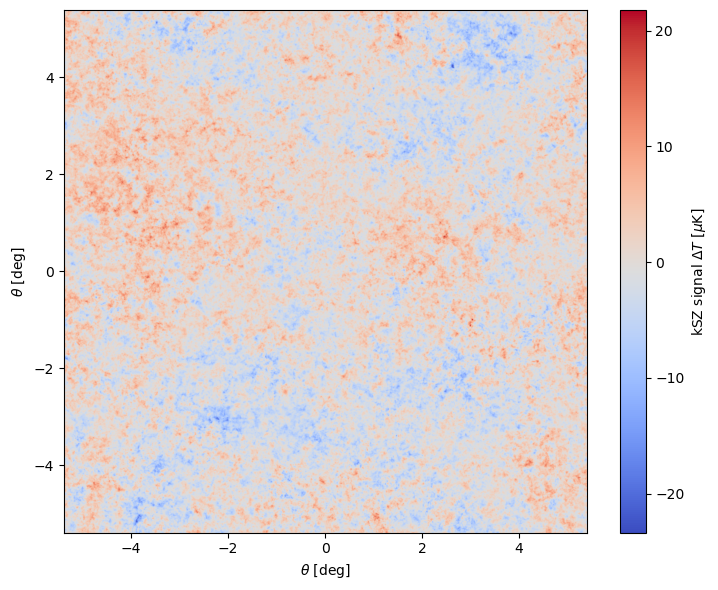

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(Tcmb*T_CMB_uK, cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'kSZ signal $\Delta T$ [$\mu$K]', fraction=0.045)
ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\theta$ [deg]')
fig.tight_layout()

kSZ from simulation's $P_{ee}$

In [68]:
# # # compute the angular ps from Pee
# # ells = np.copy(l)
# # kmax_ells = np.max(ells) / cos.comoving_distance(zz.min()).value

# # # Define integration ranges
# # k_z_integ = ells[:, None] / cos.comoving_distance(zz).value  # [Mpc-1]
# # Pee2d = interpolate.RegularGridInterpolator((kee, zz), pkee_lc.T, bounds_error=False, fill_value=None)

# # Pee_z_integ = Pee2d(np.array([k_z_integ, np.ones((ells.size, zz.size))*zz]).T)

# min_logkp = -5.0
# max_logkp = 1.5
# dlogkp = 0.05
# kp_integ = np.logspace(min_logkp, max_logkp, int((max_logkp - min_logkp) / dlogkp) + 1)

# num_th = 50
# th_integ = np.linspace(0.0001, np.pi * 0.9999, num_th)
# mu = np.cos(th_integ)  # cos(k.k')

# k_min_kp = np.sqrt(
#     k_z_integ[:, :, None, None] ** 2
#     + kp_integ[None, :, None] ** 2.0
#     - 2.0 * k_z_integ[:, :, None, None] * kp_integ[None, :, None] * mu[None, :]
# )  # in [Mpc-1]

# Pee_min_kp = Pee2d(np.array([k_min_kp, np.ones((ells.size, zz.size, kp_integ.size, mu.size))*zz]).T)

# Pee_integ = Pee2d(np.array([np.ones((zz.size, kp_integ.size))*kp_integ, np.ones((zz.size, kp_integ.size))*zz]))
# Pk_integ = Pbb2d(np.array([np.ones((zz.size, kp_integ.size))*kp_integ, np.ones((zz.size, kp_integ.size))*zz]))
# b_del_e_integ = np.sqrt(Pee_integ / Pk_integ) 

# I_e = (Pee_min_kp / kp_integ[None, :, None] ** 2.0) - (
#     np.sqrt(Pee_min_kp / self.Pk(k_min_kp, zz[None, :, None, None]))
#     * b_del_e_integ[None, :]
#     * self.Pk_lin(k_min_kp, zz[None, :, None, None])
#     / k_min_kp**2
# )

# # Compute Delta_B^2 integrand, in [s-2.Mpc^2]
# Delta_B2_integrand = (
#     k_z_integ[:, g, None, None] ** 3.0
#     / 2.0
#     / np.pi**2.0
#     * (
#         self.f_z_integ[None, g, None, None]
#         * self.adot_z_integ[None, g, None, None]
#     )
#     ** 2.0
#     * kp_integ[None, :, None] ** 3.0
#     * np.log(10.0)
#     * np.sin(th_integ[None, :])
#     / (2.0 * np.pi) ** 2.0
#     * self.Pk_lin_integ[None, g]
#     * (1.0 - mu[None, :] ** 2.0)
#     * I_e
# )
# # Compute Delta_B^2, in [s-2.Mpc^2]
# Delta_B2 = simps(simps(Delta_B2_integrand, th_integ), np.log10(kp_integ))

# # Compute C_kSZ(ell) integrand, unit 1
# C_ell_kSZ_integrand = (
#     8.0
#     * np.pi**2.0
#     / (2.0 * ells[:, None] + 1.0) ** 3.0
#     * (constants.sigma_T.value / constants.c.value) ** 2.0
#     * (
#         self.n_H_z_integ[None, g]
#         * self.x_i_z_integ[None, g]
#         / (1.0 + z_integ[None, g])
#     )
#     ** 2.0
#     * Delta_B2
#     * np.exp(-2.0 * self.tau_z_integ[None, g])
#     * self.eta_z_integ[None, g]
#     * self.detadz_z_integ[None, g]
#     * Mpcm**3.0
# )

# # Compute C_kSZ(ell), no units
# result = np.array(
#     [trapz(C_ell_kSZ_integrand[i], z_integ[g]) for i in range(ells.size)]
# )

# dl_tau_tau2 = result * l * (l+1) / 2./np.pi

(500.0, 6000.0)

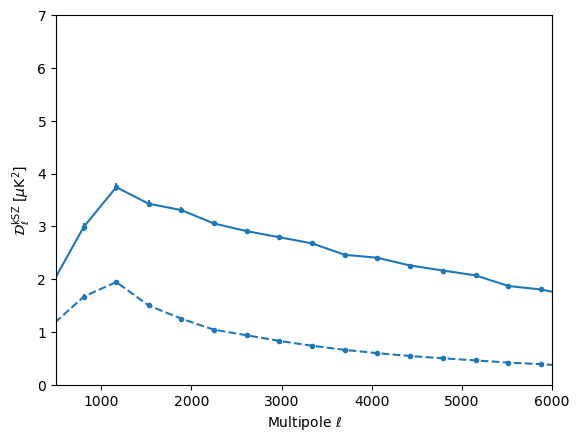

In [58]:
fig, ax = plt.subplots()
l, cl_ksz_ksz, el_ksz_ksz = compute_cross_angular_spectrum(kSZ_map, kSZ_map, theta*np.pi/180., nbins=50)
_, cl_ksz_ksz_no_dens_corr, el_ksz_ksz_no_dens_corr = compute_cross_angular_spectrum(kSZ_map_no_dens_corr, kSZ_map_no_dens_corr, theta*np.pi/180., nbins=50)
m = cl_ksz_ksz != 0.
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_ksz_ksz[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_ksz_ksz[m] / 2./np.pi,
        marker='.', color='C0')
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_ksz_ksz_no_dens_corr[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_ksz_ksz_no_dens_corr[m] / 2./np.pi,
        marker='.', ls='--', color='C0', label='Without density correlations')
# ax.set_ylim(1e-3, 1e6)
plt.xlabel(r'Multipole $\ell$')
plt.ylabel(r'$\mathcal{D}^\mathrm{kSZ}_\ell$ [$\mu$K$^2$]')
plt.ylim(0, 7)
plt.xlim(500, 6000)
# plt.yscale('symlog', linthresh=1.)

In [69]:
np.savetxt(
    'data_big_lightcone/big_lightcone_clksz.txt',
    np.c_[l, cl_ksz_ksz, el_ksz_ksz, cl_ksz_ksz_no_dens_corr, el_ksz_ksz_no_dens_corr],
    header='ell, clksz, err, clksz_no_dens_corr, err')

0.03028209635124033


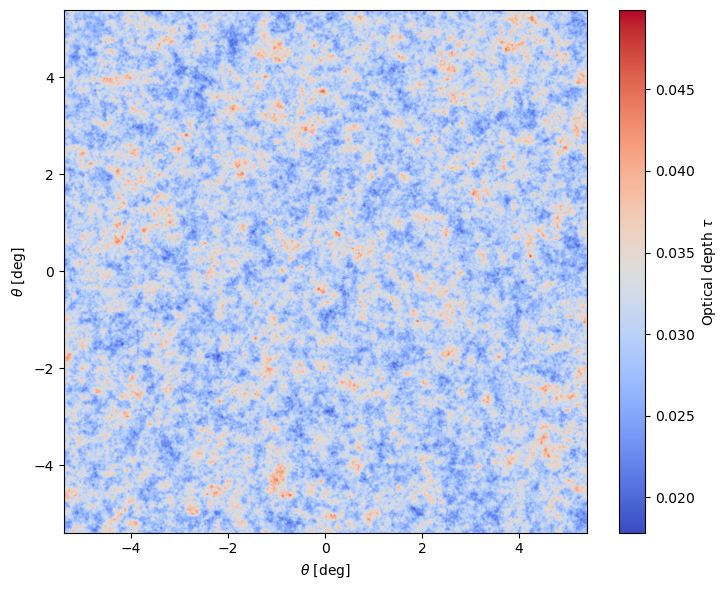

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(tau_array, cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'Optical depth $\tau$', fraction=0.045)
ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\theta$ [deg]')
fig.tight_layout()
print(np.mean(tau_array))

(0.0, 10000.0)

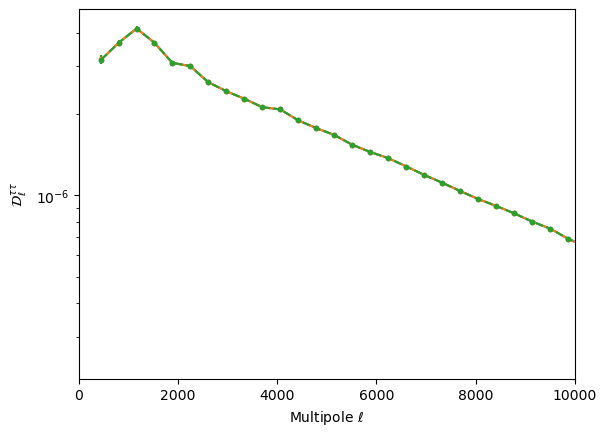

In [61]:
fig, ax = plt.subplots()
l, cl_tau2, el_tau2 = compute_cross_angular_spectrum(tau_array, tau_array, theta*np.pi/180., nbins=50)
l, cl_tau3, el_tau3 = compute_cross_angular_spectrum(tau_lc[..., -1], tau_lc[..., -1], theta*np.pi/180., nbins=50)
m = (cl_tau2 != 0.) & (l * (l+1.) * cl_tau2 / 2./np.pi < 1e-5)
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_tau_tau[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_tau_tau[m] / 2./np.pi,
        marker='.')
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_tau2[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_tau2[m] / 2./np.pi,
        marker='.')
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_tau3[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_tau3[m] / 2./np.pi,
        marker='.', ls='--')
plt.xlabel(r'Multipole $\ell$')
plt.ylabel(r'$\mathcal{D}^{\tau\tau}_\ell$')
# plt.ylim(0, 1e-5)
plt.yscale('log')
plt.xlim(0, 10000)

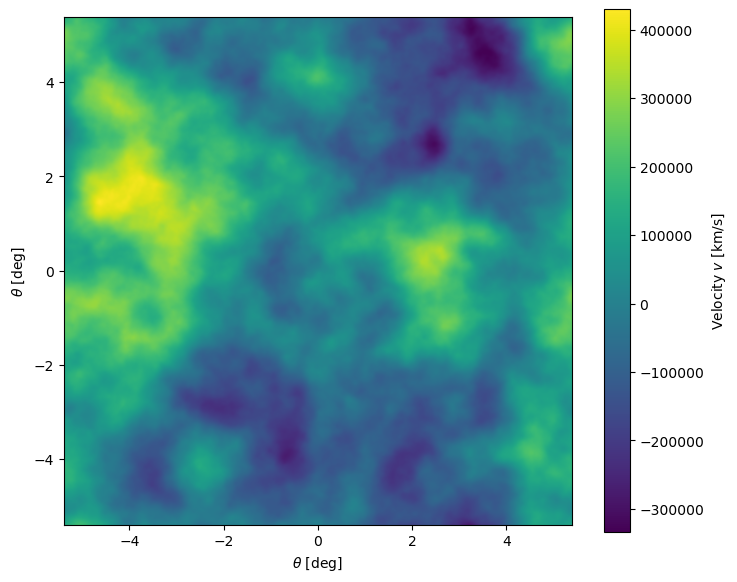

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(np.sum(lc_velocity, axis=-1)*Mpcm/1e3, #cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'Velocity $v$ [km/s]')
ax.set_xlabel(r'$\theta$ [deg]')
ax.set_ylabel(r'$\theta$ [deg]')
fig.tight_layout()

/data/glx-calcul3/data1/agorce/cross-correlations/cross-correlations/With_Pee/with_py21cmfast/../utils.py:297: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(pk2-pk**2),


(0.0, 10000.0)

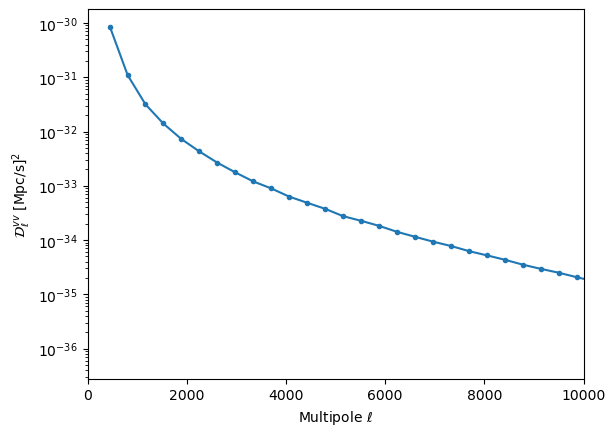

In [67]:
fig, ax = plt.subplots()
l, cl_vv, el_vv = compute_cross_angular_spectrum(np.sum(lc_velocity, axis=-1), np.sum(lc_velocity, axis=-1), theta*np.pi/180., nbins=50)
m = (cl_vv != 0.) & (l * (l+1.) * cl_vv / 2. / np.pi < 5e-30)
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_vv[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_vv[m] / 2./np.pi,
        marker='.')
# ax.set_ylim(1e-3, 1e6)
plt.xlabel(r'Multipole $\ell$')
plt.ylabel(r'$\mathcal{D}^{vv}_\ell$ [Mpc/s]$^2$')
# plt.ylim(0, 20)
plt.yscale('log')
plt.xlim(0, 10000)
# plt.yscale('symlog', linthresh=1.)

## 21cm signal

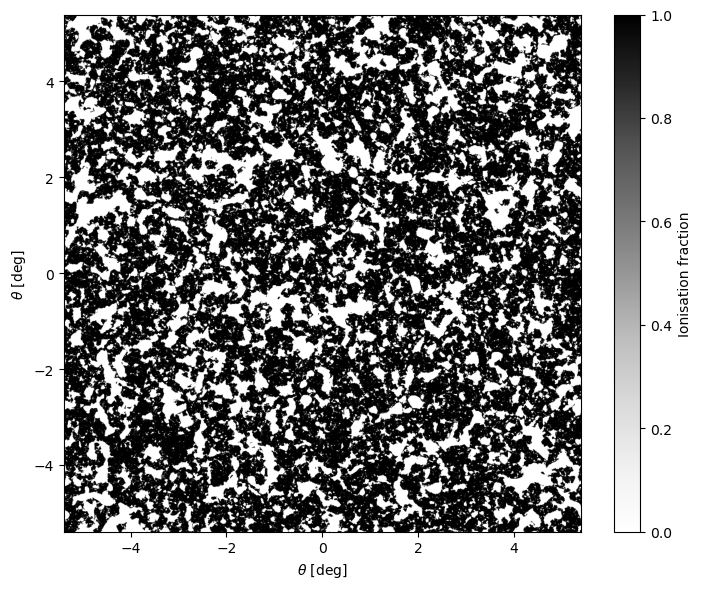

In [87]:
ii = np.argmin(np.abs(zz-8.4))
props = dict(boxstyle="round", facecolor="white", alpha=0.9)

fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow((1. - lc_xion[..., ::-1])[..., ii], cmap='Greys',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'Ionisation fraction')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
# ax.text(0.9, 0.9, rf'$z={zz[ii]:.2f}$', transform=ax.transAxes, fontsize=20, bbox=props)
fig.tight_layout()
# fig.savefig(f'xion_map_z{zz[ii]:.1f}.pdf', dpi=220)

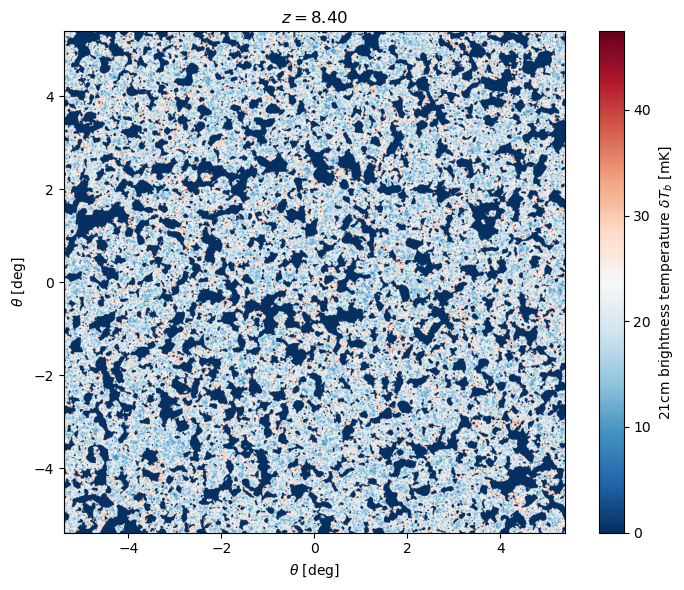

In [88]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow((lc_brightness_temp[..., ::-1])[..., ii], cmap='RdBu_r',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'21cm brightness temperature $\delta T_b$ [mK]')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
ax.set_title(rf'$z={zz[ii]:.2f}$')
fig.tight_layout()
# fig.savefig(f'dTb_map_z{zz[ii]:.1f}.png', dpi=220)

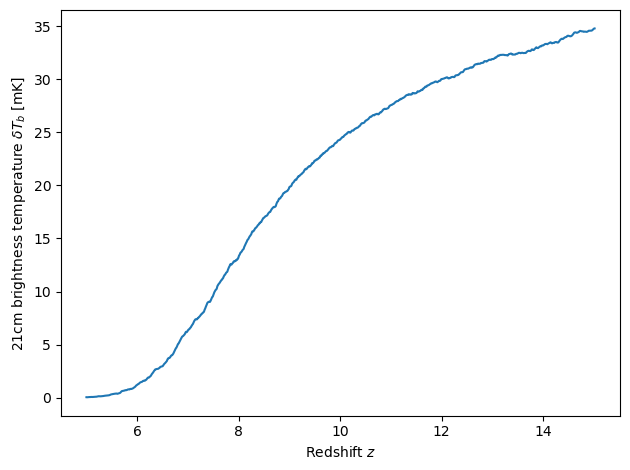

In [111]:
# dTb_lightcone = np.copy(lc_brightness_temp[..., ::-1])
mean_dTb = np.mean(lc_brightness_temp, axis=(0,1))

fig, ax = plt.subplots(1, 1)
ax.plot(zz, mean_dTb)
plt.ylabel(r'21cm brightness temperature $\delta T_b$ [mK]')
ax.set_xlabel(r'Redshift $z$')
fig.tight_layout() 

dTb_lightcone = np.copy(lc_brightness_temp) - mean_dTb[None, None, :]

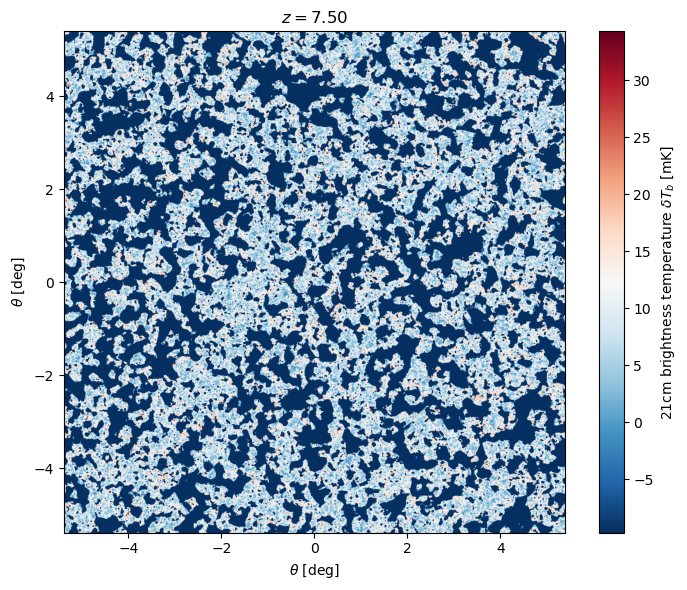

In [112]:
fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(dTb_lightcone[..., ii], cmap='RdBu_r',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
plt.colorbar(im, label=r'21cm brightness temperature $\delta T_b$ [mK]')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
ax.set_title(rf'$z={zz[ii]:.2f}$')
fig.tight_layout()
# fig.savefig(f'dTb_map_z{zz[ii]:.1f}.png', dpi=220)

In [113]:
nbins = 30

pk21, pk21_err = np.zeros((z_nodes.size, nbins)), np.zeros((z_nodes.size, nbins))
for iz, z in enumerate(z_nodes):
    ii = np.argmin(np.abs(zz-z))
    k21, pk21[iz], pk21_err[iz] = compute_ps1d(dTb_lightcone[..., ii], L, nbins=nbins)
np.savetxt('data_big_lightcone/big_lightcone_pk21.txt', np.c_[k21, pk21.T])
pk21 *= np.pi/k21[None, :]

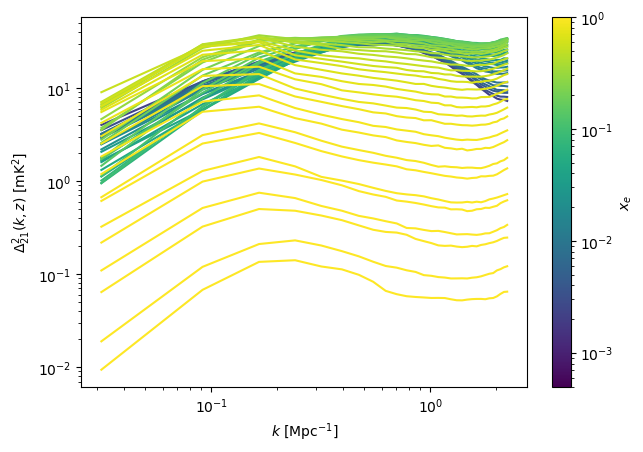

In [116]:
cmap = colormaps['viridis']
norm = colors.LogNorm(vmin=5e-4, vmax=1.)

fig, ax = plt.subplots()
for iz, z in enumerate(z_nodes):
    ax.loglog(k21, pk21[iz]*k21**3/2./np.pi**2, color=cmap(norm(glob_xHII[iz])))
# ax.set_ylim(1e0, 1e7)
ax.set_xlabel(r'$k$ [Mpc$^{-1}]$')
ax.set_ylabel(r'$\Delta^2_{21}(k, z)$ [mK$^2$]')
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
c_bar = plt.colorbar(sm, fraction=0.05, label=r'$x_e$', ax=ax)

## Cross-correlations

In [117]:
# kSZ_map = Tcmb*T_CMB_uK  # uK
# tau_map = tau_lc[..., -1]  # unit 1

z21 = 8.
ii = np.argmin(np.abs(zz-z21))
dTb_map = dTb_lightcone[..., ii] * 1000. # uK

int_21cm = np.trapezoid(np.array(dTb_lightcone * 1000.), zz, axis=-1)

fov = (theta*units.deg).to(units.rad).value

In [118]:
cmap = colormaps['plasma']
norm = colors.Normalize(vmin=5., vmax=10.) #can also use LogNorm
props = dict(boxstyle="round", facecolor="white", alpha=0.9)

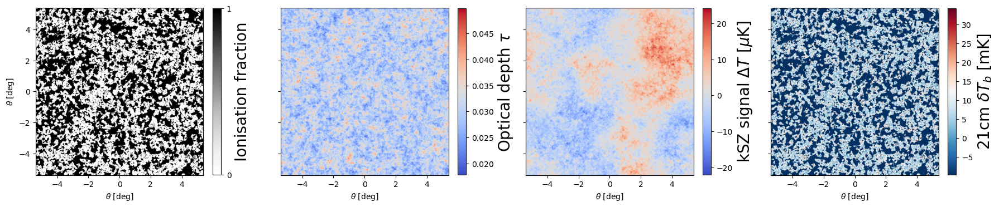

In [122]:
z21 = 7.5
ii = np.argmin(np.abs(zz-z21))

fig, axes = plt.subplots(1, 4, figsize=(18, 4), sharey=True)

# ion map
im = axes[0].imshow(lc_xion[..., ii], cmap='Greys',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar0 = plt.colorbar(im, ax=axes[0], ticks=[0,1], fraction=0.045)
cbar0.set_label(r'Ionisation fraction', fontsize=20)
axes[0].set_xlabel(r'$\theta$ [deg]')
axes[0].set_ylabel(r'$\theta$ [deg]')

# optical depth
im = axes[1].imshow(tau_lc[..., -1], cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar = plt.colorbar(im, ax=axes[1], fraction=0.045)
cbar.set_label(r'Optical depth $\tau$', fontsize=20)
axes[1].set_xlabel(r'$\theta$ [deg]')

# ksz
im = axes[2].imshow(Tcmb*T_CMB_uK, cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar2 = plt.colorbar(im, ax=axes[2], fraction=0.045)
cbar2.set_label(r'kSZ signal $\Delta T$ [$\mu$K]', fontsize=20)
axes[2].set_xlabel(r'$\theta$ [deg]')

# 21cm map
im = axes[3].imshow(dTb_lightcone[..., ii], cmap='RdBu_r',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar3 = plt.colorbar(im, ax=axes[3], fraction=0.045)
cbar3.set_label(r'21cm $\delta T_b$ [mK]', fontsize=20)
axes[3].set_xlabel(r'$\theta$ [deg]')

fig.tight_layout()
# fig.savefig(f'xion_map_z{zz[ii]:.1f}.pdf', dpi=220)
# fig.savefig('model2observables_maps.pdf', dpi=220)

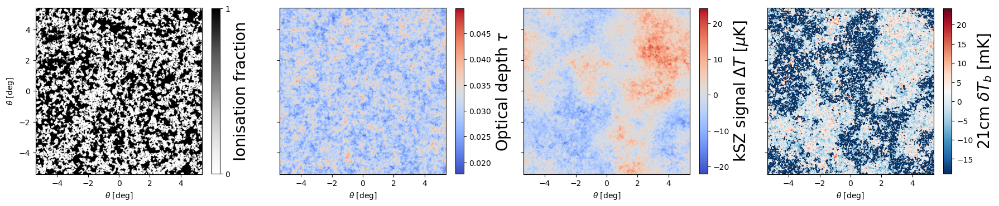

In [140]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4), sharey=True)
xi = np.linspace(-theta/2, theta/2, N)

# ion map
im = axes[0].imshow(lc_xion[..., ii], cmap='Greys',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar0 = plt.colorbar(im, ax=axes[0], ticks=[0,1], fraction=0.045)
cbar0.set_label(r'Ionisation fraction', fontsize=20)
axes[0].set_xlabel(r'$\theta$ [deg]')
axes[0].set_ylabel(r'$\theta$ [deg]')

# optical depth
im = axes[1].imshow(tau_lc[..., -1], cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar = plt.colorbar(im, ax=axes[1], fraction=0.045)
cbar.set_label(r'Optical depth $\tau$', fontsize=20)
axes[1].set_xlabel(r'$\theta$ [deg]')
# axes[1].contour(xi, xi, lc_xion[..., ii], levels=[.9999], cmap="RdBu_r", linewidths=.8)

# ksz
im = axes[2].imshow(Tcmb*T_CMB_uK, cmap='coolwarm',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar2 = plt.colorbar(im, ax=axes[2], fraction=0.045)
cbar2.set_label(r'kSZ signal $\Delta T$ [$\mu$K]', fontsize=20)
axes[2].set_xlabel(r'$\theta$ [deg]')

# 21cm map
im = axes[3].imshow(int_21cm/1000., cmap='RdBu_r',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
cbar3 = plt.colorbar(im, ax=axes[3], fraction=0.045)
cbar3.set_label(r'21cm $\delta T_b$ [mK]', fontsize=20)
axes[3].set_xlabel(r'$\theta$ [deg]')
axes[3].contour(xi, xi, Tcmb*T_CMB_uK, levels=[0.], cmap="RdBu_r", linewidths=.8)

fig.tight_layout()
# fig.savefig(f'xion_map_z{zz[ii]:.1f}.pdf', dpi=220)
# fig.savefig('model2observables_maps.pdf', dpi=220)

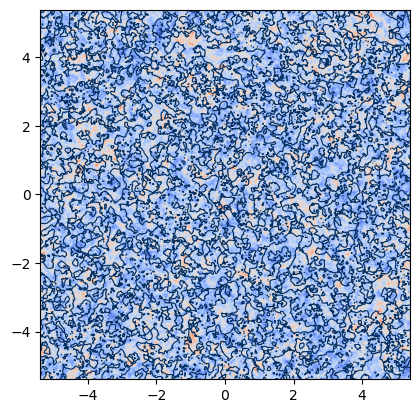

In [131]:
z21 = 7.5
ii = np.argmin(np.abs(zz-z21))

plt.imshow(tau_lc[..., -1], cmap='coolwarm',
    # lc_xion[..., ii], cmap='Greys',#cmap='RdBu_r',
             origin='lower',
             extent=(-theta/2, theta/2, -theta/2, theta/2))
# cbar = plt.colorbar(im, ax=axes[1], fraction=0.045)
# cbar.set_label(r'Optical depth $\tau$', fontsize=20)
# plt.set_xlabel(r'$\theta$ [deg]')
plt.contour(xi, xi, lc_xion[..., ii], levels=[.9999], cmap="RdBu_r", linewidths=.8)


Integrated 21cm map

5.542005420054201 11.130653266331658


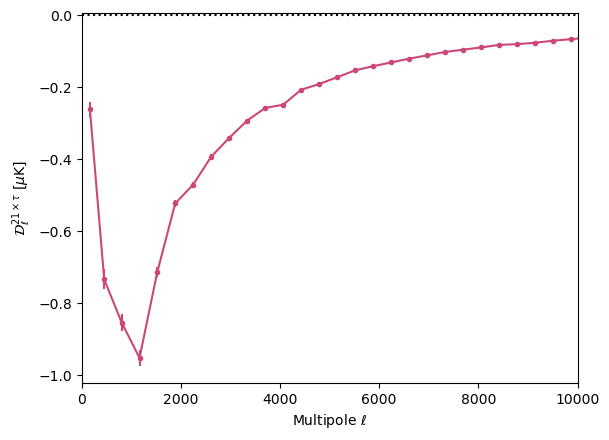

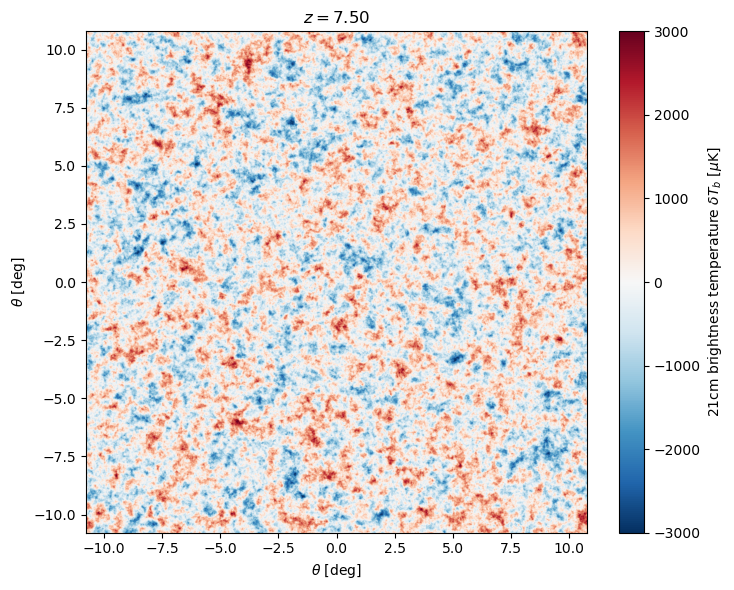

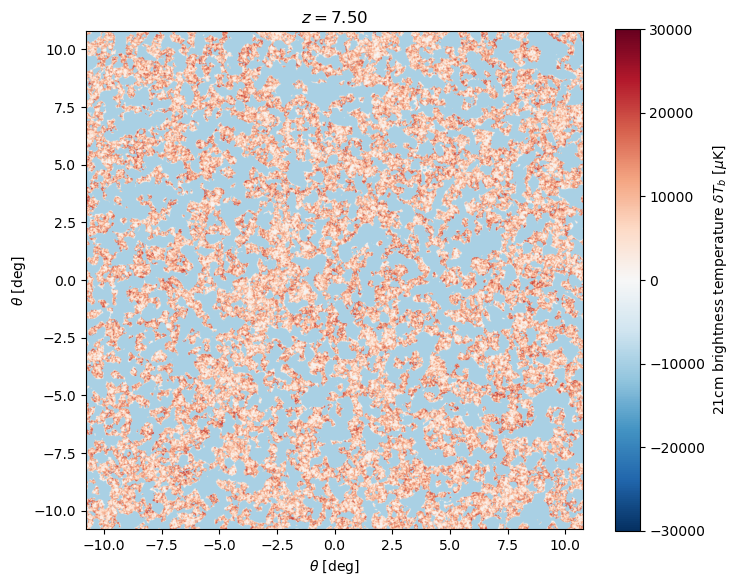

In [144]:
nu21_ref_unit = nu21_ref * units.MHz
delta_nu = 100. * units.MHz

z21 = 7.5

nu21 = nu21_ref_unit / (1. + z21)  # MHz
numax = nu21 + delta_nu/2.
numin = nu21 - delta_nu/2.
zmax = (nu21_ref_unit / numin) - 1.
zmin = (nu21_ref_unit / numax) - 1.
mz = (zz<=zmax) & (zz>=zmin)
print(zmin, zmax)

W21_zz = np.zeros_like(zz) * 1. / units.MHz
iz21 = np.argmin(np.abs(zz - z21))

W21_zz[mz] = 1./(numax-numin)  # unit T
W21_zz *= nu21_ref_unit * cos.H(zz).si / (1+zz)**2 / constants.c.si  # units L-1
W21_zz = W21_zz.to(1./units.Mpc)
W21_zz /= np.trapezoid(W21_zz.value, lc_dists)

dTb_map_temp = np.trapezoid(W21_zz.value * dTb_lightcone * 1000., lc_dists)  # uK

l, cl_tau_21, el_tau_21 = compute_cross_angular_spectrum(tau_map, dTb_map_temp, fov, nbins=50)
m = cl_tau_21 != 0.
np.savetxt(f'data_big_lightcone/big_lightcone_cltau21_z{z21:.1f}.txt', np.c_[l, cl_tau_21, el_tau_21], header='l cltau21 err [uK]')

fig, ax = plt.subplots()
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_tau_21[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_tau_21[m] / 2./np.pi,
        marker='.', color=cmap(norm(z21)),
    # label=rf'$z={z21}$'
)
# ax.set_ylim(1e-3, 1e6)
plt.xlim(0, 10000)
plt.xlabel(r'Multipole $\ell$')
plt.ylabel(r'$\mathcal{D}^{21\times \tau}_\ell$ [$\mu$K]')
plt.axhline(0, color='k', ls=':')


fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(dTb_map_temp , cmap='RdBu_r',
             origin='lower', vmin=-3000, vmax=3000,
             extent=(-theta, theta, -theta, theta))
plt.colorbar(im, label=r'21cm brightness temperature $\delta T_b$ [$\mu$K]')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
ax.set_title(rf'$z={z21:.2f}$')
fig.tight_layout()

ii = np.argmin(np.abs(zz-z21))
dTb_map_temp = dTb_lightcone[..., ii] * 1000. # uK

fig, ax = plt.subplots(1, 1, figsize=(7.5, 6))
im = ax.imshow(dTb_map_temp , cmap='RdBu_r',
             origin='lower',vmin=-30000, vmax=30000,
             extent=(-theta, theta, -theta, theta))
plt.colorbar(im, label=r'21cm brightness temperature $\delta T_b$ [$\mu$K]')
# ax.set_xlabel(r'$x$ [Mpc]')
ax.set_xlabel(r'$\theta$ [deg]')
# ax.set_ylabel(r'$y$ [Mpc]')
ax.set_ylabel(r'$\theta$ [deg]')
ax.set_title(rf'$z={z21:.2f}$')
fig.tight_layout()

In [145]:
# delta_nu = 100. * units.MHz

# nu21_ref_unit = nu21_ref * units.MHz

# fig, ax = plt.subplots()
# for z21 in tqdm.tqdm(np.arange(6, 12)):
#         nu21 = nu21_ref_unit / (1. + z21)  # MHz
#         numax = nu21 + delta_nu/2.
#         numin = nu21 - delta_nu/2.
#         zmax = (nu21_ref_unit / numin) - 1.
#         zmin = (nu21_ref_unit / numax) - 1.
#         mz = (zz<=zmax) & (zz>=zmin)

#         W21_zz = np.zeros_like(zz) * 1. / units.MHz
#         iz21 = np.argmin(np.abs(zz - z21))

#         W21_zz[mz] = 1./(numax-numin)  # unit T
#         W21_zz *= nu21_ref_unit * cos.H(zz).si / (1+zz)**2 / constants.c.si  # units L-1
#         W21_zz = W21_zz.to(1./units.Mpc)
#         W21_zz /= np.trapezoid(W21_zz.value, lc_dists)

#         # ii = np.argmin(np.abs(zz-z21))
#         # dTb_map_temp = dTb_lightcone[..., ii] * 1000. # uK
#         dTb_map_temp = np.trapezoid(W21_zz.value * dTb_lightcone * 1000., lc_dists)  # uK
#         l, cl_tau_21, el_tau_21 = compute_cross_angular_spectrum(tau_map, dTb_map_temp, fov, nbins=50)
#         m = cl_tau_21 != 0.
#         ax.errorbar(
#                 l[m], l[m] * (l[m]+1.) * cl_tau_21[m] / 2. / np.pi,
#                 yerr=l[m] * (l[m]+1.) * el_tau_21[m] / 2./np.pi,
#                 marker='.', color=cmap(norm(z21)),
#             # label=rf'$z={z21}$'
#         )
# # ax.set_ylim(1e-3, 1e6)
# plt.xlim(0, 10000)
# plt.xlabel(r'Multipole $\ell$')
# plt.ylabel(r'$\mathcal{D}^{21\times \tau}_\ell$ [$\mu$K]')
# plt.axhline(0, color='k', ls=':')
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# c_bar = plt.colorbar(sm, fraction=0.05, ax=ax, label=r'Redshift $z$')
# # plt.legend()

(0.0, 10000.0)

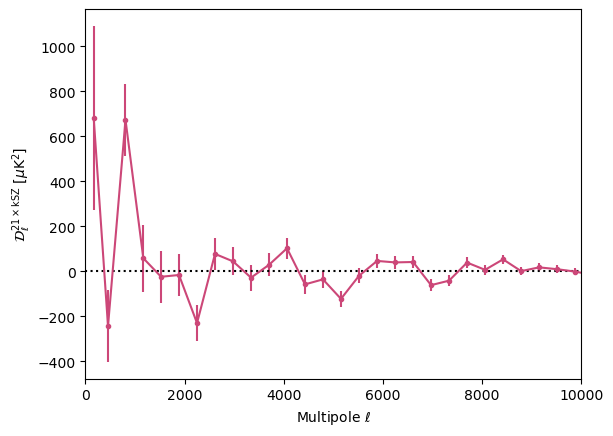

In [147]:
fig, ax = plt.subplots()
l, cl_ksz_21, el_ksz_21 = compute_cross_angular_spectrum(kSZ_map, dTb_map_temp, fov, nbins=50)
m = cl_ksz_21 != 0.
ax.errorbar(
        l[m], l[m] * (l[m]+1.) * cl_ksz_21[m] / 2. / np.pi,
        yerr=l[m] * (l[m]+1.) * el_ksz_21[m] / 2./np.pi,
        marker='.', color=cmap(norm(zz[ii])),
    # label=rf'$z={z21}$'
)
# ax.set_ylim(1e-3, 1e6)
plt.xlabel(r'Multipole $\ell$')
plt.ylabel(r'$\mathcal{D}^{21\times \mathrm{kSZ}}_\ell$ [$\mu$K$^2$]')
plt.axhline(0, color='k', ls=':')
plt.xlim(0, 10000)
# plt.yscale('symlog', linthresh=1.)

In [148]:
# fig, ax = plt.subplots()
# for z21 in np.arange(6, 12, 1):
#         ii = np.argmin(np.abs(zz-z21))
#         dTb_map_temp = dTb_lightcone[..., ii] * 1000. # uK
#         l, cl_ksz_21, el_ksz_21 = compute_cross_angular_spectrum(kSZ_map, dTb_map_temp, fov, nbins=50)
#         m = cl_ksz_21 != 0.
#         ax.errorbar(
#                 l[m], l[m] * (l[m]+1.) * cl_ksz_21[m] / 2. / np.pi,
#                 yerr=l[m] * (l[m]+1.) * el_ksz_21[m] / 2./np.pi,
#                 marker='.', color=cmap(norm(zz[ii])),
#             # label=rf'$z={z21}$'
#         )
# # ax.set_ylim(1e-3, 1e6)
# plt.xlabel(r'Multipole $\ell$')
# plt.ylabel(r'$\mathcal{D}^{21\times \mathrm{kSZ}}_\ell$ [$\mu$K$^2$]')
# plt.axhline(0, color='k', ls=':')
# plt.xlim(0, 10000)
# # plt.legend(ncols=2)
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# c_bar = plt.colorbar(sm, fraction=0.05, ax=ax, label=r'Redshift $z$')
# plt.ylim(-500, 500)
# # plt.yscale('symlog', linthresh=1.)

In [149]:
# fig, ax = plt.subplots()
# for z21 in np.arange(6, 12, 1):
#         ii = np.argmin(np.abs(zz-z21))
#         dTb_map_temp = dTb_lightcone[..., ii] * 1000. # uK
#         l, cl_ksz_21, el_ksz_21 = compute_cross_angular_spectrum(kSZ_map**2, dTb_map_temp, fov, nbins=50)
#         m = cl_ksz_21 != 0.
#         ax.errorbar(
#                 l[m], l[m] * (l[m]+1.) * cl_ksz_21[m] / 2. / np.pi,
#                 yerr=l[m] * (l[m]+1.) * el_ksz_21[m] / 2./np.pi,
#                 marker='.', color=cmap(norm(zz[ii])),
#             # label=rf'$z={z21}$'
#         )
# # ax.set_ylim(1e-3, 1e6)
# plt.xlabel(r'Multipole $\ell$')
# plt.ylabel(r'$\mathcal{D}^{21\times \mathrm{kSZ}^2}_\ell$ [$\mu$K$^3$]')
# plt.axhline(0, color='k', ls=':')
# # plt.legend(ncols=2)
# plt.xlim(0, 10000)
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# c_bar = plt.colorbar(sm, fraction=0.05, ax=ax, label=r'Redshift $z$')
# plt.ylim(-10000, 10000)
# # plt.yscale('symlog', linthresh=1.)

In [150]:
# fig, ax = plt.subplots()
# l, cl_ksz_21, el_ksz_21 = compute_cross_angular_spectrum(kSZ_map, int_21cm, fov, nbins=50)
# m = cl_ksz_21 != 0.
# ax.errorbar(
#         l[m], l[m] * (l[m]+1.) * cl_ksz_21[m] / 2. / np.pi,
#         yerr=l[m] * (l[m]+1.) * el_ksz_21[m] / 2./np.pi,
#         marker='.',
# )
# plt.xlim(0, 10000)
# # ax.set_ylim(1e-3, 1e6)
# plt.xlabel(r'Multipole $\ell$')
# plt.ylabel(r'$\mathcal{D}^{\int 21\times \mathrm{kSZ}}_\ell$ [$\mu$K$^2$]')
# plt.axhline(0, color='k', ls=':')
# # plt.legend(ncols=2)
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# c_bar = plt.colorbar(sm, fraction=0.05, ax=ax, label=r'Redshift $z$')
# plt.ylim(-500, 500)
# # plt.yscale('symlog', linthresh=1.)